In [122]:
import numpy as np
import pandas as pd
import re
import requests
from bs4 import BeautifulSoup

import matplotlib.pyplot as plt
import seaborn as sns

import time

import warnings
warnings.filterwarnings('ignore')



from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [123]:
df = pd.read_csv(r"C:\Users\devender bahadur\OneDrive\Innomatics\Projects\Web Scrabing Final Project\cleaned_df.csv")

In [13]:
df

,Unnamed: 0,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
0,0,The Godfather,1972,175,"Crime, Drama",9.2,231110,14.67,0,0,1,1,0,0,0,0,0,0,0
1,1,Goodfellas,1990,145,"Biography, Crime, Drama",8.7,382167,353.01,0,0,1,1,0,0,0,0,0,1,0
2,2,Pulp Fiction,1994,154,"Crime, Drama",8.9,84108,10.00,0,0,1,1,0,0,0,0,0,0,0
3,3,The Usual Suspects,1995,106,"Crime, Drama, Mystery",8.5,27683,0.05,0,0,1,1,0,0,0,1,0,0,0
4,4,Apocalypse Now,1979,147,"Drama, Mystery, War",8.5,413088,46.89,0,0,1,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
901,901,Blade II,2002,117,"Action, Horror, Sci-Fi",6.7,212881,82.35,1,1,0,0,0,0,1,0,0,0,0
902,902,Falling Down,1993,113,"Action, Crime, Drama",7.6,185112,40.90,1,0,1,1,0,0,0,0,0,0,0
903,903,Eyes Wide Shut,1999,159,"Drama, Mystery, Thriller",7.5,328196,55.69,0,0,1,0,0,1,0,1,0,0,0
904,904,The Lost Boys,1987,97,"Comedy, Horror",7.2,137754,32.22,0,1,0,0,1,0,0,0,0,0,0


In [14]:
df.drop('Unnamed: 0',axis=1,inplace=True)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 906 entries, 0 to 905
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Title              906 non-null    object 
 1   Year of Release    906 non-null    int64  
 2   Duration in min    906 non-null    int64  
 3   Genre              906 non-null    object 
 4   Rating             906 non-null    float64
 5   Votes in Views     906 non-null    int64  
 6   Gross in Millions  906 non-null    float64
 7   Action             906 non-null    int64  
 8   Horror             906 non-null    int64  
 9   Drama              906 non-null    int64  
 10  Crime              906 non-null    int64  
 11  Comedy             906 non-null    int64  
 12  Thriller           906 non-null    int64  
 13  Sci-Fi             906 non-null    int64  
 14  Mystery            906 non-null    int64  
 15  Adventure          906 non-null    int64  
 16  Biography          906 non

# EDA

### Here comes the plotting part

***1.Question is which plot is better for visualization***

***2.From that what info we get?***

***3.Finally what we conclude from that plot?***

# `I.Univariate Analysis`

* Countplot(cat)
* pieplot(cat)
* distplot(num)
* histogram(num)
* boxplot(num)

# 1.Count plot on Rating column

In [16]:
dy = df.nlargest(500,'Year of Release')
dd = df.nlargest(600,'Duration in min')
dr = df.nlargest(300,'Rating')
dv = df.nlargest(300,'Votes in Views')
dg = df.nlargest(300,'Gross in Millions')

In [17]:
df.head(1)

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
0,The Godfather,1972,175,"Crime, Drama",9.2,231110,14.67,0,0,1,1,0,0,0,0,0,0,0


In [18]:
# From the above plot most of the movies has rating of 7.3 and those movies are code below.
df[df['Rating']==7.3].loc[:,'Title':'Gross in Millions']

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
88,Men in Black,1997,98,"Action, Adventure, Comedy",7.3,212881,82.35
127,Gremlins,1984,106,"Comedy, Fantasy, Horror",7.3,47229,2.65
136,The Life Aquatic with Steve Zissou,2004,119,"Action, Adventure, Comedy",7.3,19276,5.00
145,Dumb and Dumber,1994,107,Comedy,7.3,89237,37.74
148,Shallow Grave,1994,89,"Crime, Thriller",7.3,413872,56.82
...,...,...,...,...,...,...,...
853,Fast Five,2011,130,"Action, Adventure, Crime",7.3,373781,209.84
856,Shut Up and Play the Hits,2012,108,"Documentary, Music",7.3,2782,0.51
858,Rocky II,1979,119,"Drama, Sport",7.3,204340,6.39
892,Detroit,2017,143,"Crime, Drama, History",7.3,52362,16.79


# 2.Count plot on Year of release column

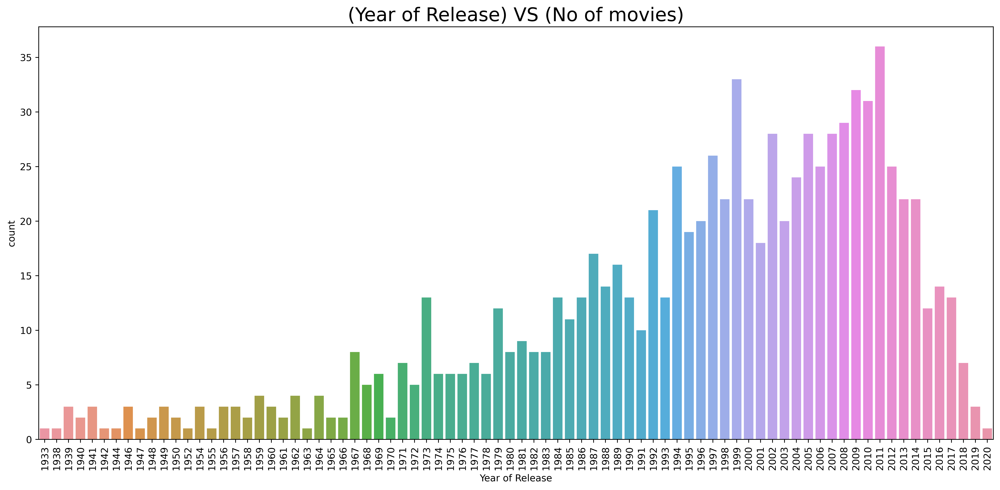

In [19]:
plt.figure(figsize=(18,8),dpi=600)
sns.countplot(data = df,x = 'Year of Release')
plt.xticks(rotation = 90)
plt.title('(Year of Release) VS (No of movies)',fontsize=20);

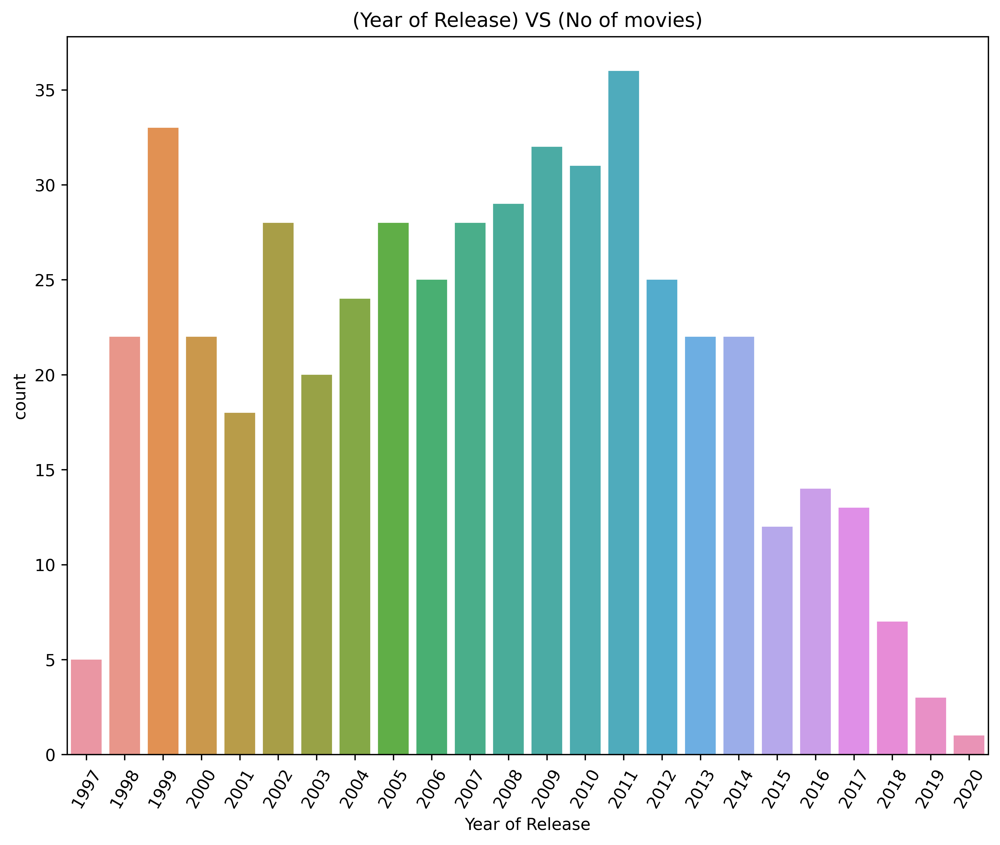

In [20]:
plt.figure(figsize=(10,8),dpi=600)
sns.countplot(data = dy,x = 'Year of Release')
plt.xticks(rotation = 60)
plt.title('(Year of Release) VS (No of movies)');

In [21]:
# From the above plot most of the movies has released on year 2011 and those movies are code below.
df[df['Year of Release']==2011].loc[:,'Title':'Gross in Millions']
len(df[df['Year of Release']==2011])

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
189,Serbuan maut,2011,101,"Action, Crime, Thriller",7.6,84108,10.00
197,Hugo,2011,126,"Adventure, Drama, Family",7.5,202981,8.75
221,Shame,2011,101,Drama,7.2,434224,66.26
236,La piel que habito,2011,120,"Drama, Horror, Thriller",7.6,213172,44.54
279,Rise of the Planet of the Apes,2011,105,"Action, Drama, Sci-Fi",7.6,231110,14.67
280,Moneyball,2011,133,"Biography, Drama, Sport",7.6,382167,353.01
283,Hodejegerne,2011,100,"Action, Crime, Thriller",7.5,136921,52.10
310,Mission: Impossible - Ghost Protocol,2011,132,"Action, Adventure, Thriller",7.4,22190,1.91
323,Rango,2011,107,"Animation, Action, Adventure",7.2,18286,32.48
344,50/50,2011,100,"Comedy, Drama, Romance",7.6,337259,0.27


36

# Pie Chart

In [22]:
df

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
0,The Godfather,1972,175,"Crime, Drama",9.2,231110,14.67,0,0,1,1,0,0,0,0,0,0,0
1,Goodfellas,1990,145,"Biography, Crime, Drama",8.7,382167,353.01,0,0,1,1,0,0,0,0,0,1,0
2,Pulp Fiction,1994,154,"Crime, Drama",8.9,84108,10.00,0,0,1,1,0,0,0,0,0,0,0
3,The Usual Suspects,1995,106,"Crime, Drama, Mystery",8.5,27683,0.05,0,0,1,1,0,0,0,1,0,0,0
4,Apocalypse Now,1979,147,"Drama, Mystery, War",8.5,413088,46.89,0,0,1,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
901,Blade II,2002,117,"Action, Horror, Sci-Fi",6.7,212881,82.35,1,1,0,0,0,0,1,0,0,0,0
902,Falling Down,1993,113,"Action, Crime, Drama",7.6,185112,40.90,1,0,1,1,0,0,0,0,0,0,0
903,Eyes Wide Shut,1999,159,"Drama, Mystery, Thriller",7.5,328196,55.69,0,0,1,0,0,1,0,1,0,0,0
904,The Lost Boys,1987,97,"Comedy, Horror",7.2,137754,32.22,0,1,0,0,1,0,0,0,0,0,0


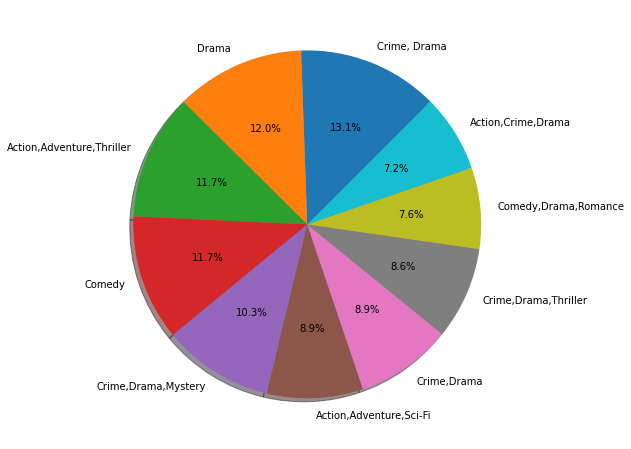

In [126]:
plt.figure(figsize=(15,8))
label=['Crime, Drama','Drama','Action,Adventure,Thriller','Comedy','Crime,Drama,Mystery','Action,Adventure,Sci-Fi','Crime,Drama','Crime,Drama,Thriller','Comedy,Drama,Romance','Action,Crime,Drama']
plt.pie(df['Genre'].value_counts().iloc[:10],labels=label,startangle=45,autopct='%1.1f%%',shadow=True)
plt.show();

# 3.count plot on Genre column

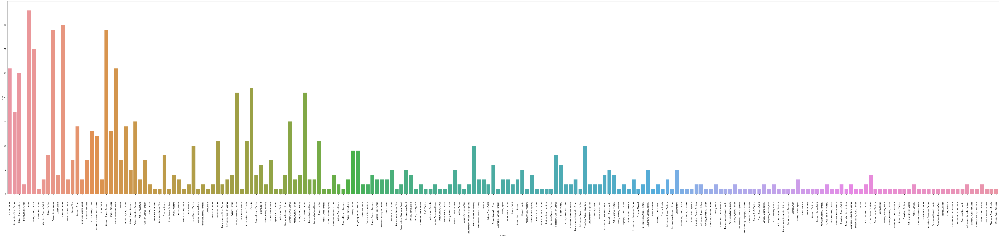

In [24]:
plt.figure(figsize=(100,20))
sns.countplot(data = df,x ='Genre')
plt.xticks(rotation = 90);

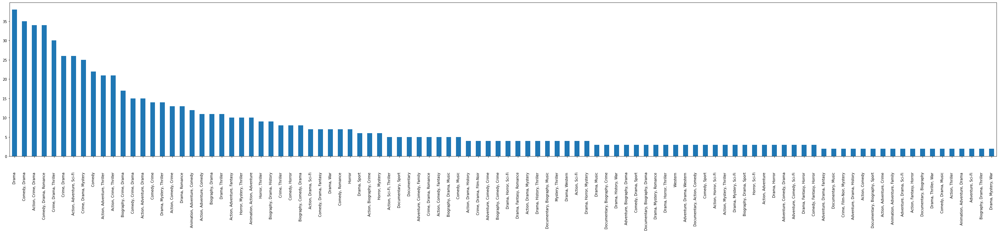

In [25]:
df['Genre'].value_counts().nlargest(100).plot(kind = 'bar',figsize=(50,8));

In [26]:
plt.figure(figsize=(50,8),dpi=600)
sns.countplot(data = df,x = 'Genre')
plt.xticks(rotation = 90)
plt.xlabel('Genre',loc='left',fontsize=20)
plt.ylabel('No of Movies',fontsize=20)
plt.title('(Genre) vs (No of Movies)',loc='left',fontsize=20);

In [27]:
df.head(1)

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
0,The Godfather,1972,175,"Crime, Drama",9.2,231110,14.67,0,0,1,1,0,0,0,0,0,0,0


In [28]:
# From the above plot most of the movies has based on Drama genre and those movies are code below.
df[df['Drama']==1].loc[:,'Title':'Gross in Millions']

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
0,The Godfather,1972,175,"Crime, Drama",9.2,231110,14.67
1,Goodfellas,1990,145,"Biography, Crime, Drama",8.7,382167,353.01
2,Pulp Fiction,1994,154,"Crime, Drama",8.9,84108,10.00
3,The Usual Suspects,1995,106,"Crime, Drama, Mystery",8.5,27683,0.05
4,Apocalypse Now,1979,147,"Drama, Mystery, War",8.5,413088,46.89
...,...,...,...,...,...,...,...
897,The Edge of Seventeen,2016,104,"Comedy, Drama",7.3,120647,14.43
898,Molly's Game,2017,140,"Biography, Crime, Drama",7.4,163505,28.78
900,A Star Is Born,2018,136,"Drama, Music, Romance",7.6,370472,215.29
902,Falling Down,1993,113,"Action, Crime, Drama",7.6,185112,40.90


# 4.Plotting Gross in Millions column

### a.Count plot on Gross in millions columns

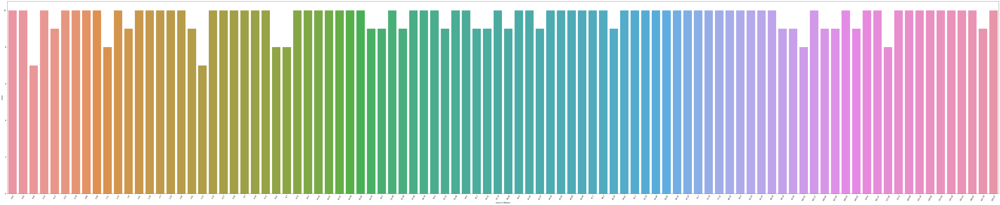

In [29]:
plt.figure(figsize=(100,20))
sns.countplot(data = df,x ='Gross in Millions')
plt.xticks(rotation = 60);
# from this we can't say most of the movies got how much collection, plot is some what confusing.
# In this case we used Histogram

### b.Histogram on Gross in millions columns

In [30]:
# For this we took highest and lowest gross value in the dataframe to know the range values
df.nlargest(1,'Gross in Millions')
df.nsmallest(1,'Gross in Millions')

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
33,The Truman Show,1998,103,"Comedy, Drama",8.2,648119,424.67,0,0,1,0,1,0,0,0,0,0,0


,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
47,Being John Malkovich,1999,113,"Comedy, Drama, Fantasy",7.8,3841,0.01,0,0,1,0,1,0,0,0,0,0,0


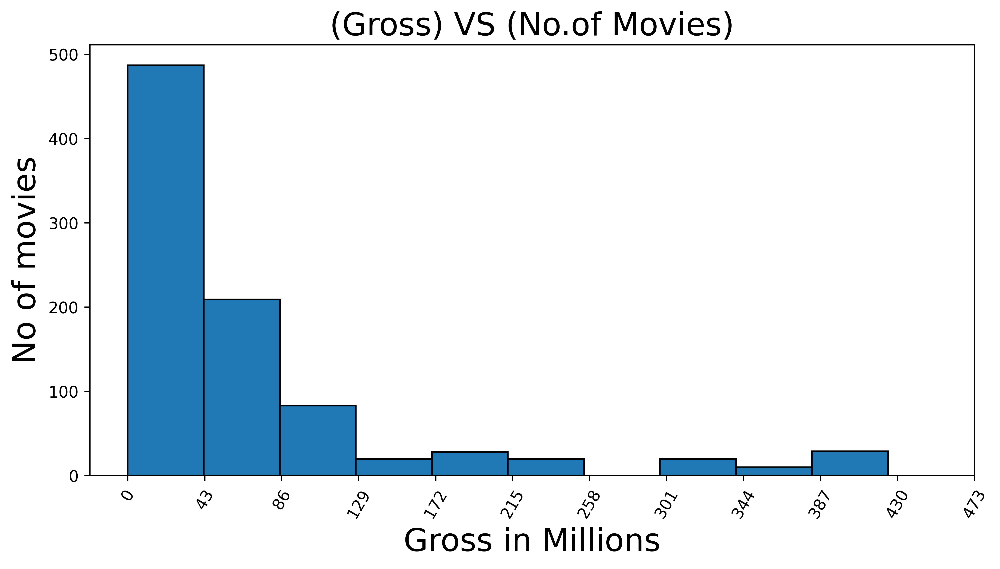

In [31]:
plt.figure(figsize=(10,5),dpi=600)
plt.hist(data = df,x ='Gross in Millions',edgecolor='black')
plt.xticks(np.arange(0,500,43),rotation = 60)
plt.xlabel('Gross in Millions',fontsize=20)
plt.ylabel('No of movies',fontsize=20)
plt.title('(Gross) VS (No.of Movies)',fontsize=20);

In [32]:
# From the above plot most of the movies has its collection upto 43millions and those movies are code below.
df[df['Gross in Millions']<=43].loc[:,'Title':'Gross in Millions']

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
0,The Godfather,1972,175,"Crime, Drama",9.2,231110,14.67
2,Pulp Fiction,1994,154,"Crime, Drama",8.9,84108,10.00
3,The Usual Suspects,1995,106,"Crime, Drama, Mystery",8.5,27683,0.05
6,Fight Club,1999,139,Drama,8.8,83594,16.31
7,Boogie Nights,1997,155,Drama,7.9,30356,0.96
...,...,...,...,...,...,...,...
897,The Edge of Seventeen,2016,104,"Comedy, Drama",7.3,120647,14.43
898,Molly's Game,2017,140,"Biography, Crime, Drama",7.4,163505,28.78
899,Free Fire,2016,91,"Action, Comedy, Crime",6.3,46142,1.80
902,Falling Down,1993,113,"Action, Crime, Drama",7.6,185112,40.90


# 5.Plotting Votes in views Column

### a.Countplot on Votes in views Column

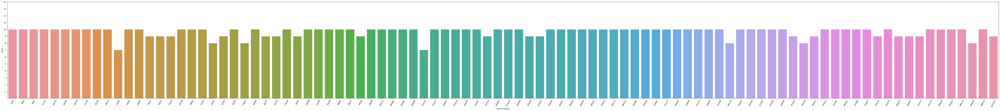

In [33]:
plt.figure(figsize=(100,10))
sns.countplot(data = df,x = 'Votes in Views')
plt.xticks(rotation = 60)
plt.yticks(np.arange(1,15));

# from this we can't say most of the movies got how much Votes, plot is some what confusing.
# In this case we used Histogram

### b.Histogram on Votes in views Column

In [34]:
# For this Histogram we are checking the least and highest value for giving range 
df.nlargest(1,'Votes in Views')
df.nsmallest(1,"Votes in Views")

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
64,Blue Velvet,1986,120,"Crime, Drama, Mystery",7.7,1016751,422.78,0,0,1,1,0,0,0,1,0,0,0


,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
42,Chinatown,1974,130,"Drama, Mystery, Thriller",8.2,2782,0.51,0,0,1,0,0,1,0,1,0,0,0


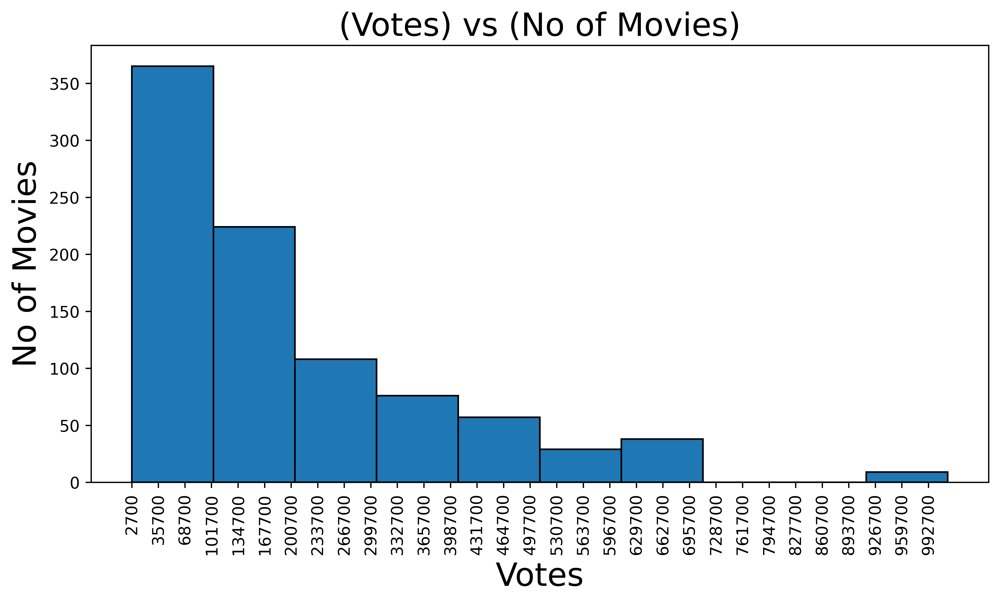

In [35]:
plt.figure(figsize=(10,5),dpi=600)
plt.hist(data = df,x = 'Votes in Views',edgecolor='black')
plt.xticks(np.arange(2700,1004300,33000),rotation = 90)
plt.xlabel('Votes',fontsize=20)
plt.ylabel('No of Movies',fontsize=20)
plt.title('(Votes) vs (No of Movies)',fontsize=20);

In [36]:
# From the above plot we observe that most of the views are in between 2762 and 102700 and those movies are code below.
df[df['Votes in Views']<=101700].loc[:,'Title':'Gross in Millions']

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
2,Pulp Fiction,1994,154,"Crime, Drama",8.9,84108,10.00
3,The Usual Suspects,1995,106,"Crime, Drama, Mystery",8.5,27683,0.05
6,Fight Club,1999,139,Drama,8.8,83594,16.31
7,Boogie Nights,1997,155,Drama,7.9,30356,0.96
13,Back to the Future,1985,116,"Adventure, Comedy, Sci-Fi",8.6,73924,4.56
...,...,...,...,...,...,...,...
878,Fletch,1985,98,"Comedy, Crime, Mystery",6.9,51401,50.61
880,Sleeper,1973,89,"Comedy, Sci-Fi",7.1,42693,2.91
892,Detroit,2017,143,"Crime, Drama, History",7.3,52362,16.79
896,Dear Zachary: A Letter to a Son About His Father,2008,95,"Documentary, Biography, Crime",8.5,36104,0.02


# 6.Count plot on Duration in min Column

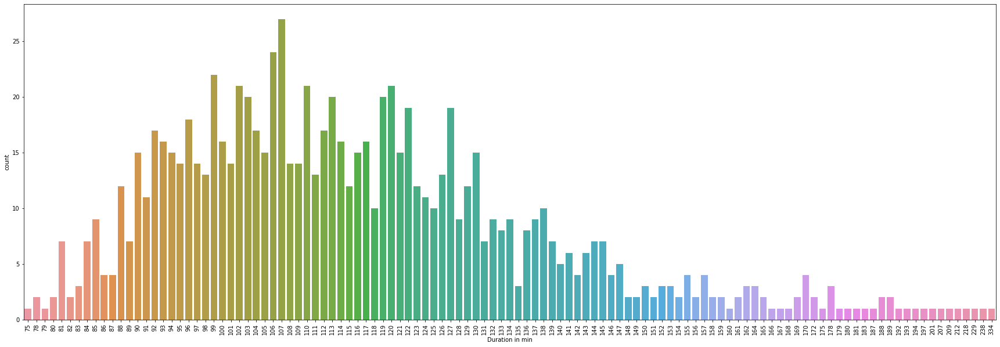

In [37]:
plt.figure(figsize=(30,10))
sns.countplot(data = df,x = 'Duration in min')
plt.xticks(rotation = 90);

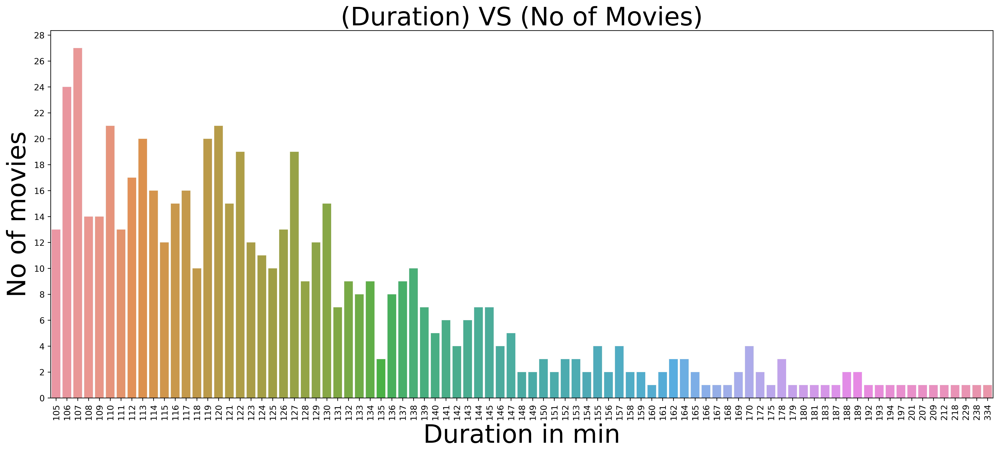

In [38]:
plt.figure(figsize=(20,8),dpi=600)
sns.countplot(data = dd,x = 'Duration in min')
plt.xticks(rotation = 90)
plt.yticks(np.arange(0,30,2))
plt.xlabel('Duration in min',fontsize=30)
plt.ylabel('No of movies',fontsize=30)
plt.title('(Duration) VS (No of Movies)',fontsize=30);

In [39]:
# From the above plot comparatively most of the movies has time duration of 107minutes and those movies are code below.
df[df['Duration in min']==107].loc[:,'Title':'Gross in Millions']
len(df[df['Duration in min']==107])

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
32,"Lock, Stock and Two Smoking Barrels",1998,107,"Action, Comedy, Crime",8.2,22190,1.91
95,The Terminator,1984,107,"Action, Sci-Fi",8.1,84108,10.00
143,"O Brother, Where Art Thou?",2000,107,"Adventure, Comedy, Crime",7.7,213172,44.54
145,Dumb and Dumber,1994,107,Comedy,7.3,89237,37.74
158,In Bruges,2008,107,"Comedy, Crime, Drama",7.9,1016751,422.78
164,The Sixth Sense,1999,107,"Drama, Mystery, Thriller",8.2,599110,218.82
198,Sunshine,2007,107,"Sci-Fi, Thriller",7.2,103145,2.24
215,Grosse Pointe Blank,1997,107,"Action, Comedy, Crime",7.3,48482,0.23
278,Field of Dreams,1989,107,"Drama, Family, Fantasy",7.5,547316,324.59
284,This Is the End,2013,107,Comedy,6.6,83594,16.31


27

# `II. Bi-Variate Plots`

1. BOX PLOT
2. BAR PLOT                 
3. VOILIN PLOT 

### BAR GRAPHS FOR GROSS IN MILLIONS AND ACTION MOVIES

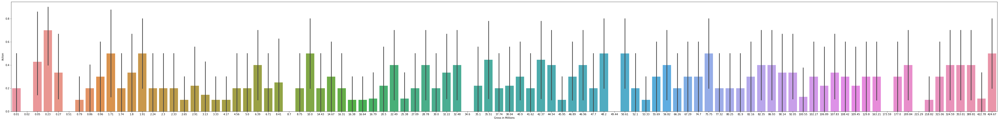

In [40]:
plt.figure(figsize=(70,8))
sns.barplot(x='Gross in Millions',y='Action',data=df)
plt.show();

### BAR GRAPH FOR GROSS IN MILLIONS & THRILLER MOVIES

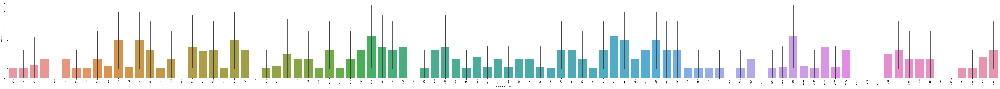

In [41]:
plt.figure(figsize=(100,8))
sns.barplot(x='Gross in Millions',y='Thriller',data=df)
plt.xticks(rotation =90)
plt.show();

### BAR GRAPH FOR GROSS IN MILLIONS AND HORROR MOVIES

In [127]:
df1 = df.nlargest(30,"Gross in Millions")

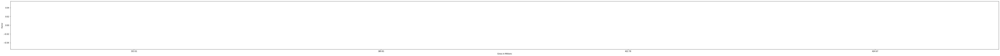

In [128]:
plt.figure(figsize=(100,5))
sns.barplot(x='Gross in Millions',y='Horror',data=df1)
plt.show();

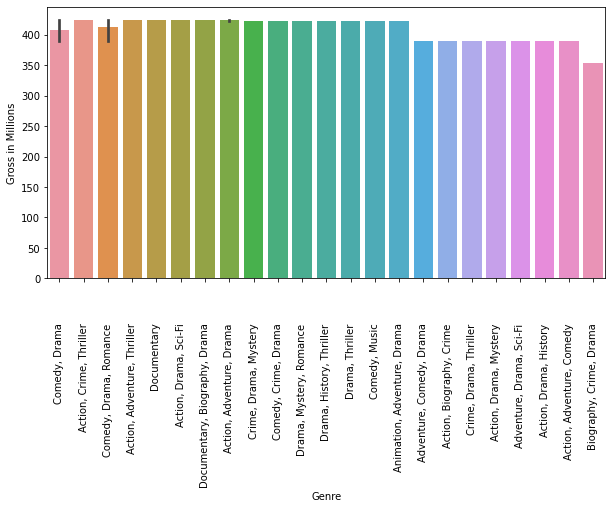

In [129]:
plt.figure(figsize=(10,5))
sns.barplot(x='Genre',y='Gross in Millions',data=df1)
plt.xticks(rotation =90)
plt.show();

### `Violin plot for [Action,Drama,Comedy] vs Votes in Views`

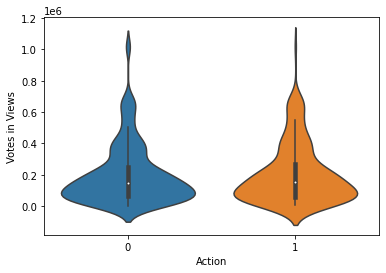

In [45]:
sns.violinplot(df['Action'],df['Votes in Views'])
plt.show();

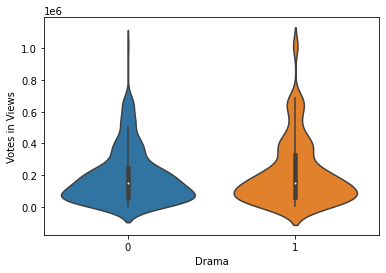

In [46]:
sns.violinplot(df['Drama'],df['Votes in Views'])
plt.show();

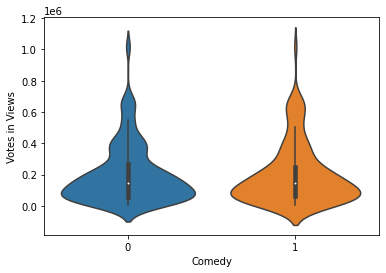

In [47]:
sns.violinplot(df['Comedy'],df['Votes in Views'])
plt.show();

### `Box-Plot for all Genres vs Gross in Millions`

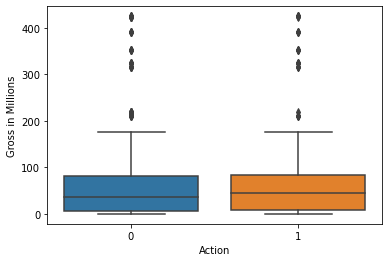

In [48]:
sns.boxplot(df["Action"],df["Gross in Millions"])
plt.show();

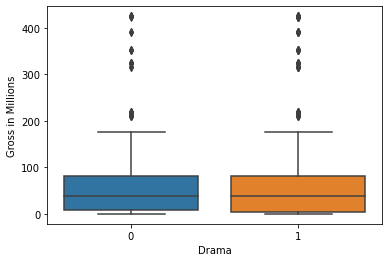

In [49]:
sns.boxplot(df["Drama"],df["Gross in Millions"])
plt.show();

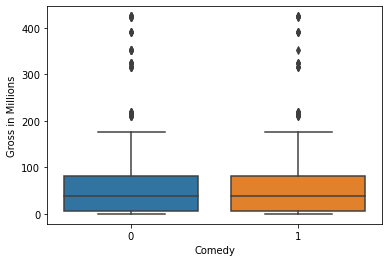

In [50]:
sns.boxplot(df["Comedy"],df["Gross in Millions"])
plt.show();

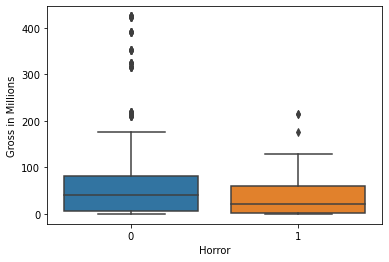

In [51]:
sns.boxplot(df["Horror"],df["Gross in Millions"])
plt.show();

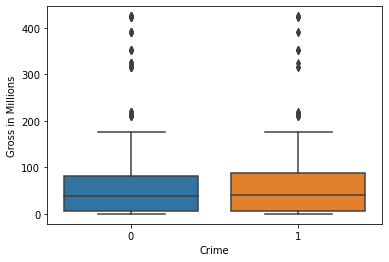

In [52]:
sns.boxplot(df["Crime"],df["Gross in Millions"])
plt.show();

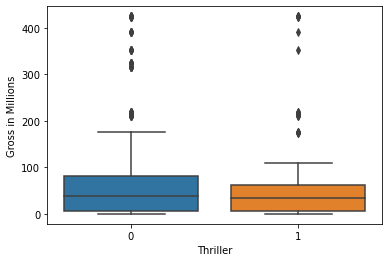

In [53]:
sns.boxplot(df["Thriller"],df["Gross in Millions"])
plt.show();

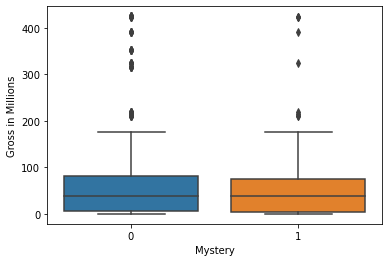

In [54]:
sns.boxplot(df["Mystery"],df["Gross in Millions"])
plt.show();

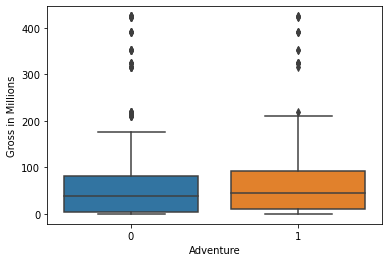

In [55]:
sns.boxplot(df["Adventure"],df["Gross in Millions"])
plt.show();

### `Bar-Plot for all Genres vs Gross in Millions`

In [56]:
df.head(1)

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
0,The Godfather,1972,175,"Crime, Drama",9.2,231110,14.67,0,0,1,1,0,0,0,0,0,0,0


<AxesSubplot:xlabel='Action'>

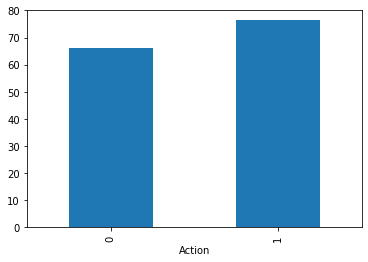

In [57]:
df.groupby(["Action"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Drama'>

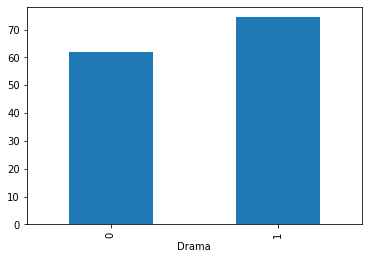

In [58]:
df.groupby(["Drama"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Mystery'>

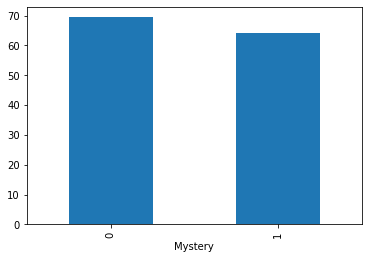

In [59]:
df.groupby(["Mystery"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Horror'>

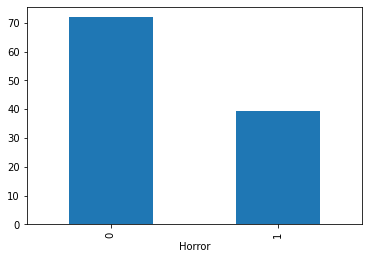

In [60]:
df.groupby(["Horror"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Crime'>

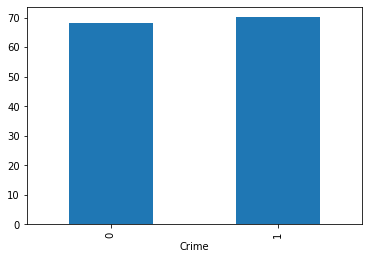

In [61]:
df.groupby(["Crime"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Comedy'>

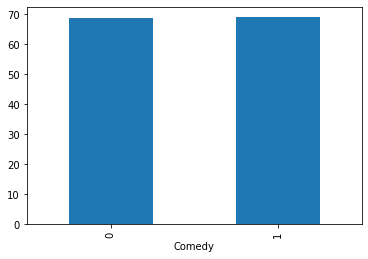

In [62]:
df.groupby(["Comedy"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Thriller'>

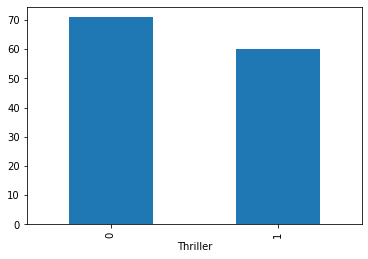

In [63]:
df.groupby(["Thriller"])["Gross in Millions"].mean().plot(kind="bar")

<AxesSubplot:xlabel='Adventure'>

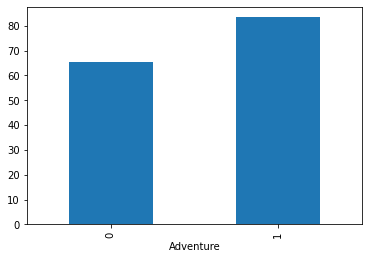

In [64]:
df.groupby(["Adventure"])["Gross in Millions"].mean().plot(kind="bar")

In [65]:
df.groupby(['Action'])['Gross in Millions'].mean()

Action
0    66.221597
1    76.328390
Name: Gross in Millions, dtype: float64

In [66]:
df.groupby(['Comedy'])['Gross in Millions'].mean()

Comedy
0    68.790717
1    69.008826
Name: Gross in Millions, dtype: float64

In [67]:
df.groupby(['Drama'])['Gross in Millions'].mean()

Drama
0    61.795804
1    74.384331
Name: Gross in Millions, dtype: float64

In [68]:
df.groupby(['Crime'])['Gross in Millions'].mean()

Crime
0    68.341535
1    70.121379
Name: Gross in Millions, dtype: float64

In [69]:
df.groupby(['Horror'])['Gross in Millions'].mean()

Horror
0    71.870122
1    39.342024
Name: Gross in Millions, dtype: float64

In [70]:
df.groupby(['Thriller'])['Gross in Millions'].mean()

Thriller
0    70.889837
1    60.104912
Name: Gross in Millions, dtype: float64

In [71]:
df.groupby(['Mystery'])['Gross in Millions'].mean()

Mystery
0    69.431163
1    64.097857
Name: Gross in Millions, dtype: float64

In [72]:
df.groupby(['Adventure'])['Gross in Millions'].mean()

Adventure
0    65.465048
1    83.421988
Name: Gross in Millions, dtype: float64

1. Adventure = 82.81M
2. Action = 75.15M
3. Drama = 74.34M
4. Crime = 0,1 = 69.80M
5. Comedy = 0,1 = 68.86M
6. Thriller = 60.95M
7. Mystery = 63.45M
8. Horror = 39.78M

# Bar plot on Genre vs Rating

<AxesSubplot:xlabel='Drama'>

Drama
0    7.444975
1    7.635827
Name: Rating, dtype: float64

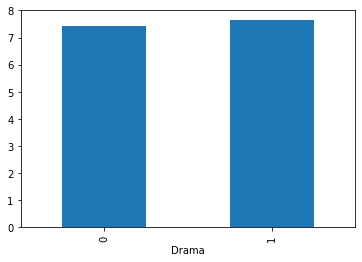

In [73]:
df.groupby(['Drama'])['Rating'].mean().plot(kind='bar')
df.groupby(['Drama'])['Rating'].mean()

<AxesSubplot:xlabel='Comedy'>

Comedy
0    7.629907
1    7.362500
Name: Rating, dtype: float64

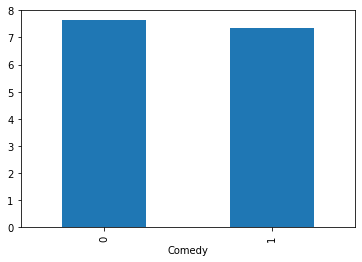

In [74]:
df.groupby(['Comedy'])['Rating'].mean().plot(kind='bar')
df.groupby(['Comedy'])['Rating'].mean()

<AxesSubplot:xlabel='Crime'>

Crime
0    7.559070
1    7.534483
Name: Rating, dtype: float64

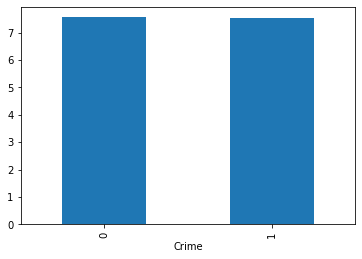

In [75]:
df.groupby(['Crime'])['Rating'].mean().plot(kind='bar')
df.groupby(['Crime'])['Rating'].mean()

<AxesSubplot:xlabel='Action'>

Action
0    7.567463
1    7.508051
Name: Rating, dtype: float64

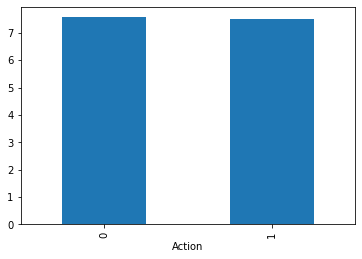

In [76]:
df.groupby(['Action'])['Rating'].mean().plot(kind='bar')
df.groupby(['Action'])['Rating'].mean()

<AxesSubplot:xlabel='Horror'>

Horror
0    7.586618
1    7.213095
Name: Rating, dtype: float64

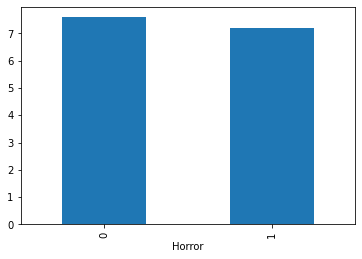

In [77]:
df.groupby(['Horror'])['Rating'].mean().plot(kind='bar')
df.groupby(['Horror'])['Rating'].mean()

<AxesSubplot:xlabel='Thriller'>

Thriller
0    7.582721
1    7.419883
Name: Rating, dtype: float64

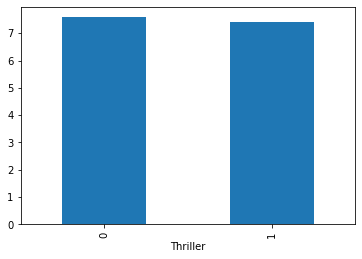

In [78]:
df.groupby(['Thriller'])['Rating'].mean().plot(kind='bar')
df.groupby(['Thriller'])['Rating'].mean()

<AxesSubplot:xlabel='Mystery'>

Mystery
0    7.538614
1    7.662245
Name: Rating, dtype: float64

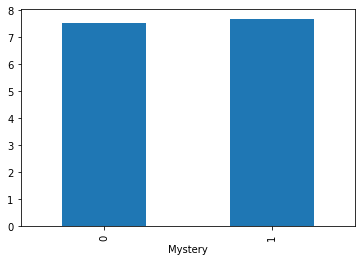

In [79]:
df.groupby(['Mystery'])['Rating'].mean().plot(kind='bar')
df.groupby(['Mystery'])['Rating'].mean()

<AxesSubplot:xlabel='Adventure'>

Adventure
0    7.528571
1    7.652632
Name: Rating, dtype: float64

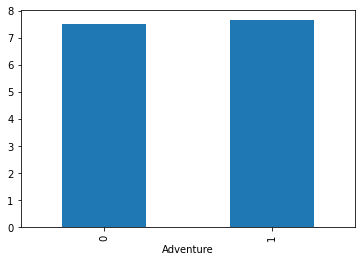

In [80]:
df.groupby(['Adventure'])['Rating'].mean().plot(kind='bar')
df.groupby(['Adventure'])['Rating'].mean()

# Bar plot on Genre vs Votes in Views

<AxesSubplot:xlabel='Drama'>

Drama
0    186763.771357
1    210821.226378
Name: Votes in Views, dtype: float64

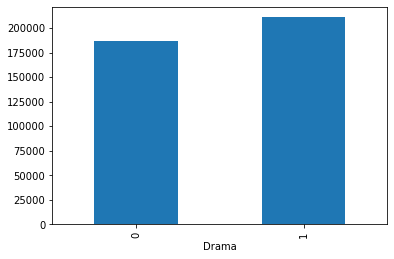

In [81]:
df.groupby(['Drama'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Drama'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Comedy'>

Comedy
0    201030.177570
1    198362.840909
Name: Votes in Views, dtype: float64

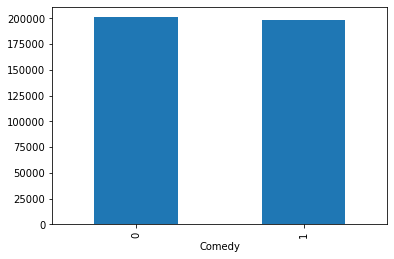

In [82]:
df.groupby(['Comedy'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Comedy'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Crime'>

Crime
0    201659.491473
1    196776.980843
Name: Votes in Views, dtype: float64

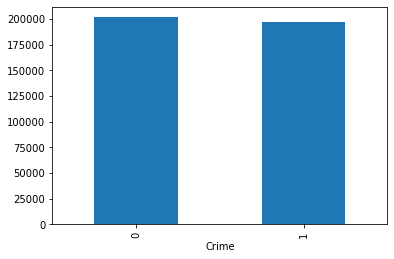

In [83]:
df.groupby(['Crime'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Crime'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Action'>

Action
0    198887.90597
1    204128.25000
Name: Votes in Views, dtype: float64

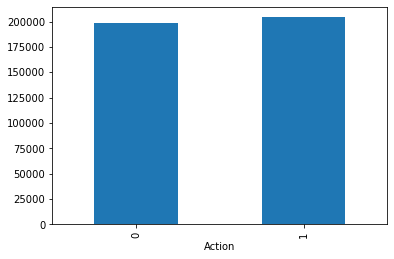

In [84]:
df.groupby(['Action'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Action'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Horror'>

Horror
0    205006.877129
1    153732.273810
Name: Votes in Views, dtype: float64

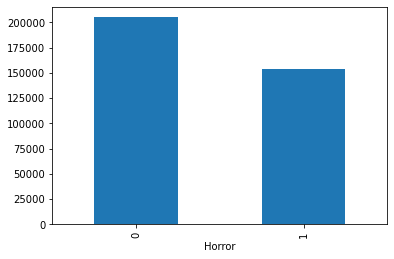

In [85]:
df.groupby(['Horror'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Horror'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Thriller'>

Thriller
0    201896.862585
1    193186.959064
Name: Votes in Views, dtype: float64

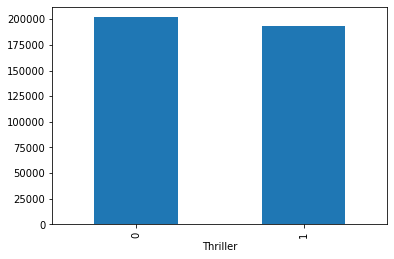

In [86]:
df.groupby(['Thriller'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Thriller'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Mystery'>

Mystery
0    199479.809406
1    206627.326531
Name: Votes in Views, dtype: float64

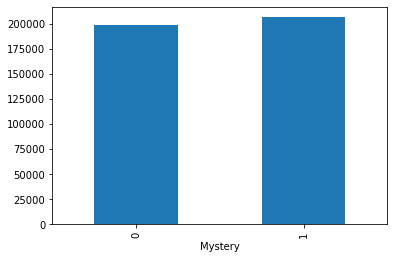

In [87]:
df.groupby(['Mystery'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Mystery'])['Votes in Views'].mean()

<AxesSubplot:xlabel='Adventure'>

Adventure
0    196233.191837
1    217530.807018
Name: Votes in Views, dtype: float64

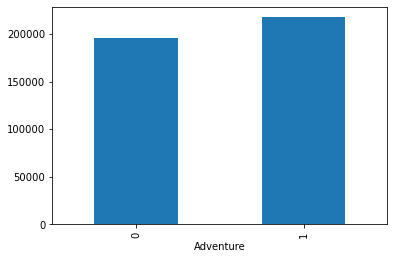

In [88]:
df.groupby(['Adventure'])['Votes in Views'].mean().plot(kind='bar')
df.groupby(['Adventure'])['Votes in Views'].mean()

# `III.Multi-Variate Analysis`

# Heat Map 

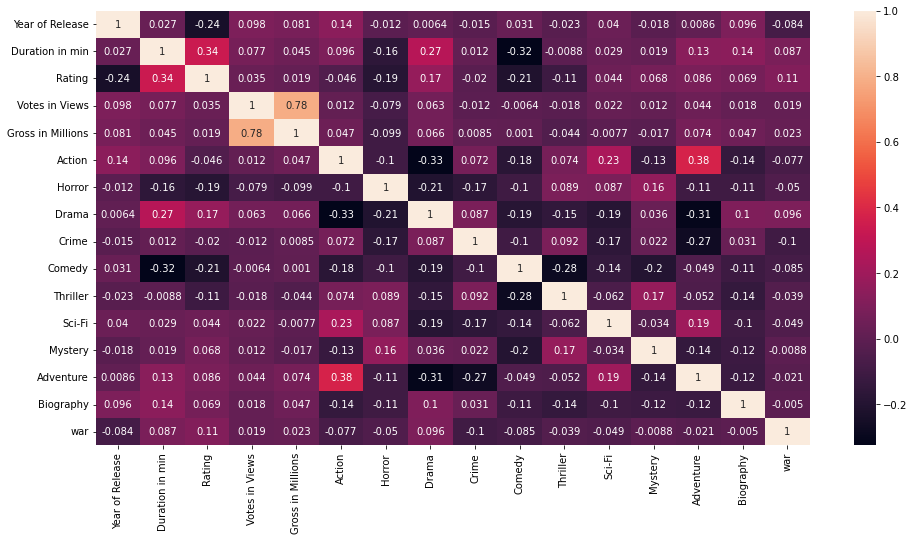

In [89]:
plt.figure(figsize=(16,8))
sns.heatmap(df.corr(),annot= True,linecolor='c');

## 1.RATINGS & GROSS IN MILLIONS FOR ACTION MOVIES

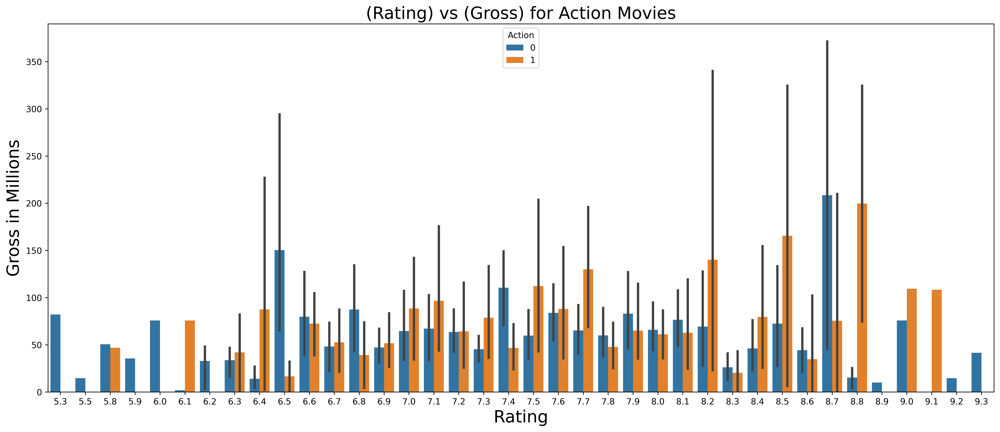

In [90]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Action')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Action Movies',fontsize=20);

### ` From the above plot,Most of the Action Movies with Gross above 80M and movies are code below.`

In [91]:
# From the above plot,Most of the Action Movies with Gross above 80M and movies are code below.
df[(df['Rating']==8.8)&(df['Action']==1)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
92,Inception,2010,148,"Action, Adventure, Sci-Fi",8.8,547316,324.59,1,0,0,0,0,0,1,0,1,0,0
130,The Lord of the Rings: The Two Towers,2002,179,"Action, Adventure, Drama",8.8,233947,74.70,1,0,1,0,0,0,0,0,1,0,0


---

# 2.RATINGS & GROSS IN MILLIONS FOR HORROR MOVIES

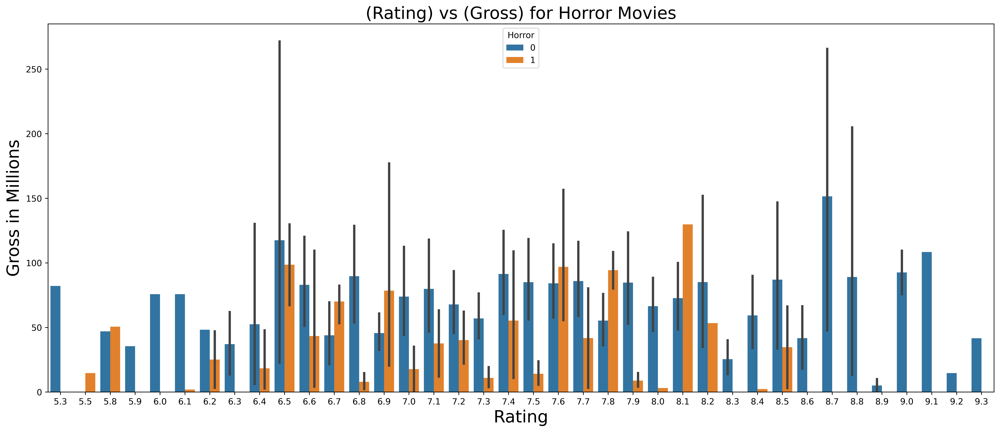

In [92]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Horror')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Horror Movies',fontsize=20);

In [93]:
df[(df['Rating']==6.9)&(df['Horror']==1)].loc[:,'Title':'Gross in Millions']

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions
204,28 Weeks Later,2007,100,"Action, Adventure, Horror",6.9,325384,177.00
510,Near Dark,1987,94,Horror,6.9,74741,38.04
761,Trolljegeren,2010,103,"Drama, Fantasy, Horror",6.9,65143,20.50


---

# 3.RATINGS & GROSS IN MILLIONS FOR DRAMA MOVIES

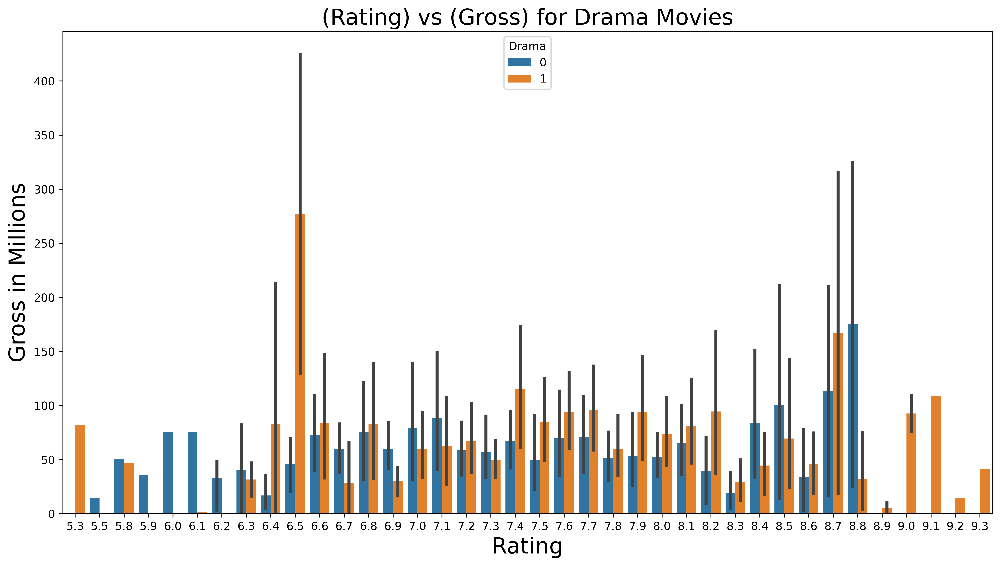

In [94]:
plt.figure(figsize=(15,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Drama')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Drama Movies',fontsize=20);

In [95]:
df[(df['Rating']==6.4)&(df['Drama']==1)].head(3)

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
549,Choke,2008,92,"Comedy, Drama",6.4,328196,55.69,0,0,1,0,1,0,0,0,0,0,0
553,The Rover,2014,103,"Action, Crime, Drama",6.4,382167,353.01,1,0,1,1,0,0,0,0,0,0,0
631,Crash,1996,100,Drama,6.4,36104,0.02,0,0,1,0,0,0,0,0,0,0,0


---

# 4.RATINGS & GROSS IN MILLIONS FOR CRIME MOVIES

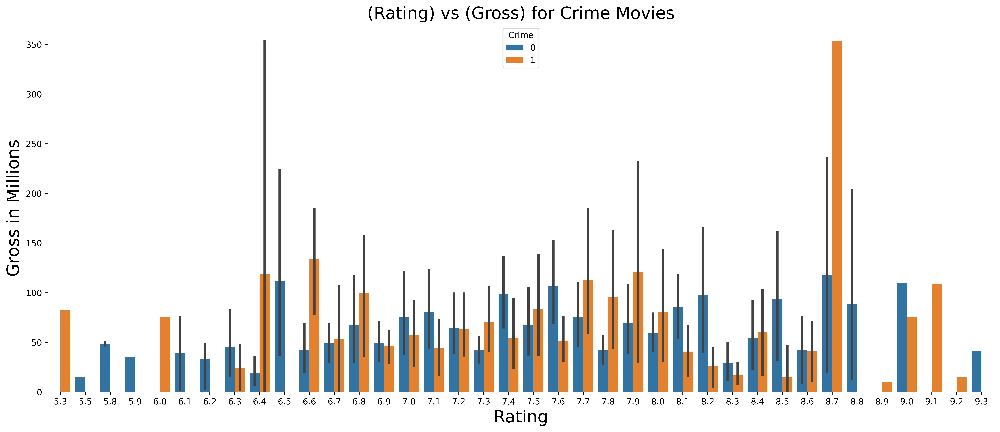

In [96]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Crime')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Crime Movies',fontsize=20);

In [97]:
df[(df['Rating']==8.7)&(df['Crime']==1)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
1,Goodfellas,1990,145,"Biography, Crime, Drama",8.7,382167,353.01,0,0,1,1,0,0,0,0,0,1,0


---

# 5.RATINGS & GROSS IN MILLIONS FOR COMEDY MOVIES :-

In [98]:

plt.figure(figsize=(20,10),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Comedy')
plt.xticks(rotation = 90)
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Comedy Movies',fontsize=20);

In [99]:
df[(df['Rating']==7.9)&(df['Comedy']==1)]
len(df[(df['Rating']==7.9)&(df['Comedy']==1)])

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
73,Toy Story 2,1999,92,"Animation, Adventure, Comedy",7.9,224016,163.21,0,0,0,0,1,0,0,0,1,0,0
80,Almost Famous,2000,122,"Adventure, Comedy, Drama",7.9,643007,389.81,0,0,1,0,1,0,0,0,1,0,0
158,In Bruges,2008,107,"Comedy, Crime, Drama",7.9,1016751,422.78,0,0,1,1,1,0,0,0,0,0,0
219,Harold and Maude,1971,91,"Comedy, Drama, Romance",7.9,648119,424.67,0,0,1,0,1,0,0,0,0,0,0
276,Fantastic Mr. Fox,2009,87,"Animation, Adventure, Comedy",7.9,328196,55.69,0,0,0,0,1,0,0,0,1,0,0
361,Shaun of the Dead,2004,99,"Comedy, Horror",7.9,36104,0.02,0,1,0,0,1,0,0,0,0,0,0
380,Sing Street,2016,106,"Comedy, Drama, Music",7.9,202981,8.75,0,0,1,0,1,0,0,0,0,0,0
405,Back to the Future Part II,1989,108,"Adventure, Comedy, Sci-Fi",7.9,151858,106.89,0,0,0,0,1,0,1,0,1,0,0
469,Do the Right Thing,1989,120,"Comedy, Drama",7.9,30356,0.96,0,0,1,0,1,0,0,0,0,0,0
495,His Girl Friday,1940,92,"Comedy, Drama, Romance",7.9,47229,2.65,0,0,1,0,1,0,0,0,0,0,0


16

---

# 6.RATINGS & GROSS IN MILLIONS FOR THRILLER MOVIES

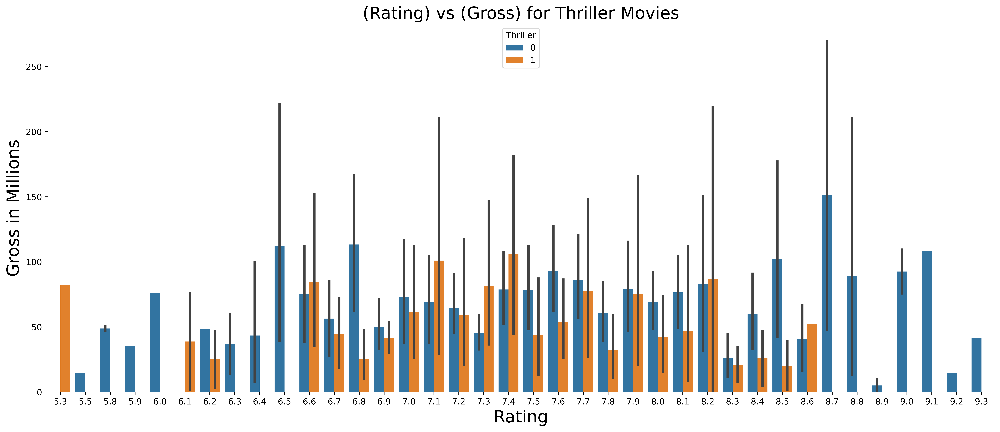

In [100]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Thriller')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Thriller Movies',fontsize=20);

In [101]:
df[(df['Thriller']==1)&(df['Rating']==7.1)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
241,Day of the Dead,1985,101,"Horror, Thriller",7.1,413872,56.82,0,1,0,0,0,1,0,0,0,0,0
311,Mission: Impossible,1996,110,"Action, Adventure, Thriller",7.1,648119,424.67,1,0,0,0,0,1,0,0,1,0,0
314,Snowpiercer,2013,126,"Action, Sci-Fi, Thriller",7.1,151858,106.89,1,0,0,0,0,1,1,0,0,0,0
362,The Spy Who Loved Me,1977,125,"Action, Adventure, Thriller",7.1,120647,14.43,1,0,0,0,0,1,0,0,1,0,0
695,Margin Call,2011,107,"Drama, Thriller",7.1,96160,49.44,0,0,1,0,0,1,0,0,0,0,0
857,Southern Comfort,1981,106,"Action, Thriller",7.1,19276,5.00,1,0,0,0,0,1,0,0,0,0,0
873,Runaway Jury,2003,127,"Crime, Drama, Thriller",7.1,96160,49.44,0,0,1,1,0,1,0,0,0,0,0


---

# 7.RATINGS & GROSS IN MILLIONS FOR SCI-FI MOVIES

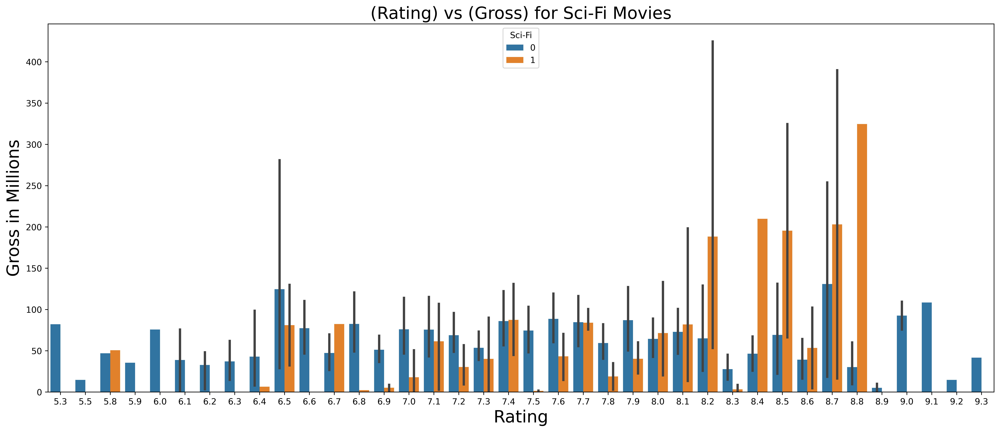

In [102]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Sci-Fi')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Sci-Fi Movies',fontsize=20);

In [103]:
df[(df['Sci-Fi']==1)&(df['Rating']==8.6)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
13,Back to the Future,1985,116,"Adventure, Comedy, Sci-Fi",8.6,73924,4.56,0,0,0,0,1,0,1,0,1,0,0
72,Terminator 2: Judgment Day,1991,137,"Action, Sci-Fi",8.6,168326,102.27,1,0,0,0,0,0,1,0,0,0,0


---

# 8.RATINGS & GROSS IN MILLIONS FOR MYSTERY MOVIES

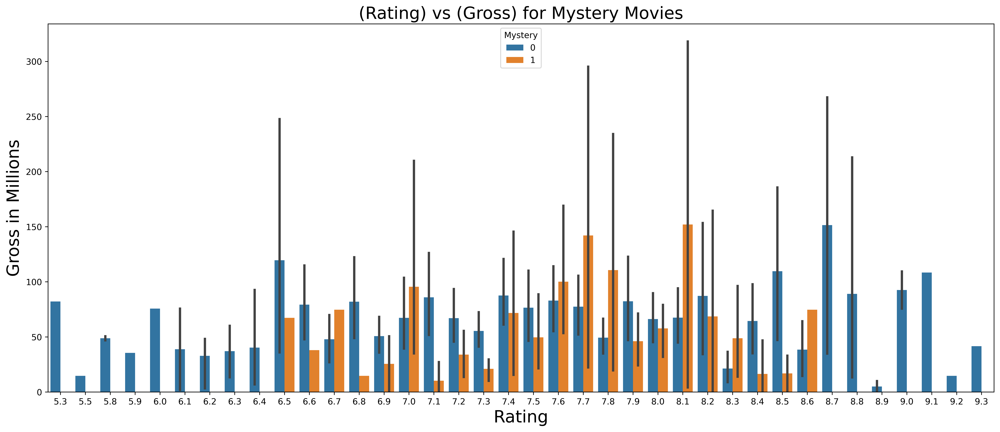

In [104]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Mystery')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Mystery Movies',fontsize=20);

In [105]:
df[(df['Mystery']==1)&(df['Rating']==8.1)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
251,Trois couleurs: Rouge,1994,99,"Drama, Mystery, Romance",8.1,1016751,422.78,0,0,1,0,0,0,0,1,0,0,0
295,The Third Man,1949,104,"Film-Noir, Mystery, Thriller",8.1,325384,177.00,0,0,0,0,0,1,0,1,0,0,0
339,Salinui chueok,2003,131,"Crime, Drama, Mystery",8.1,86641,4.17,0,0,1,1,0,0,0,1,0,0,0
698,Prisoners,2013,153,"Crime, Drama, Mystery",8.1,86641,4.17,0,0,1,1,0,0,0,1,0,0,0


---

# 9.RATINGS & GROSS IN MILLIONS FOR ADVENTURE MOVIES

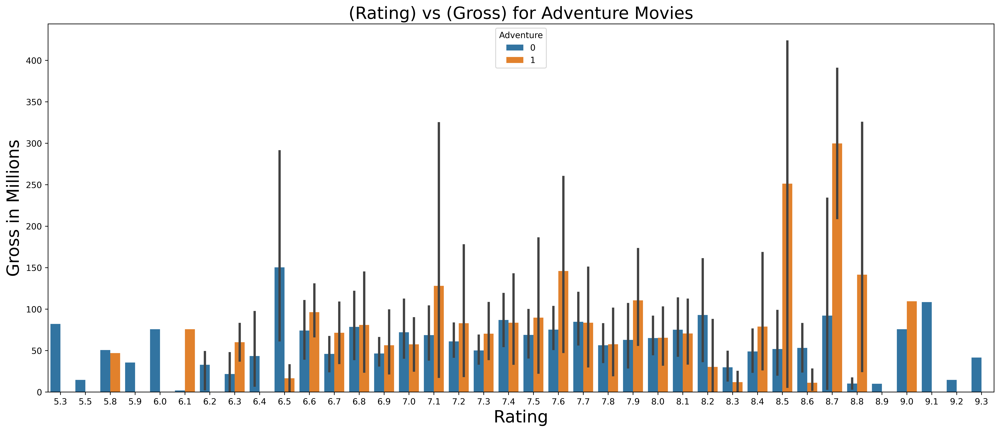

In [106]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Adventure')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Adventure Movies',fontsize=20);

In [107]:
df[(df['Adventure']==1)&(df['Rating']==7.6)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
146,The Jungle Book,1967,78,"Animation, Adventure, Comedy",7.6,146982,80.25,0,0,0,0,1,0,0,0,1,0,0
299,End of Watch,2012,109,"Action, Adventure, Crime",7.6,81698,48.20,1,0,0,1,0,0,0,0,1,0,0
309,Batoru rowaiaru,2000,114,"Action, Adventure, Drama",7.6,39627,35.51,1,0,1,0,0,0,0,0,1,0,0
342,Dawn of the Planet of the Apes,2014,130,"Action, Adventure, Drama",7.6,1016751,422.78,1,0,1,0,0,0,0,0,1,0,0
464,Star Wars: Episode III - Revenge of the Sith,2005,140,"Action, Adventure, Fantasy",7.6,84108,10.00,1,0,0,0,0,0,0,0,1,0,0
559,Mad Max 2,1981,96,"Action, Adventure, Sci-Fi",7.6,30356,0.96,1,0,0,0,0,0,1,0,1,0,0
639,Sherlock Holmes,2009,128,"Action, Adventure, Mystery",7.6,547316,324.59,1,0,0,0,0,0,0,1,1,0,0
651,Die Hard: With a Vengeance,1995,128,"Action, Adventure, Thriller",7.6,122218,0.79,1,0,0,0,0,1,0,0,1,0,0
893,Guardians of the Galaxy Vol. 2,2017,136,"Action, Adventure, Comedy",7.6,643007,389.81,1,0,0,0,1,0,0,0,1,0,0


---

# 10.RATINGS & GROSS IN MILLIONS FOR BIOGRAPHY MOVIES

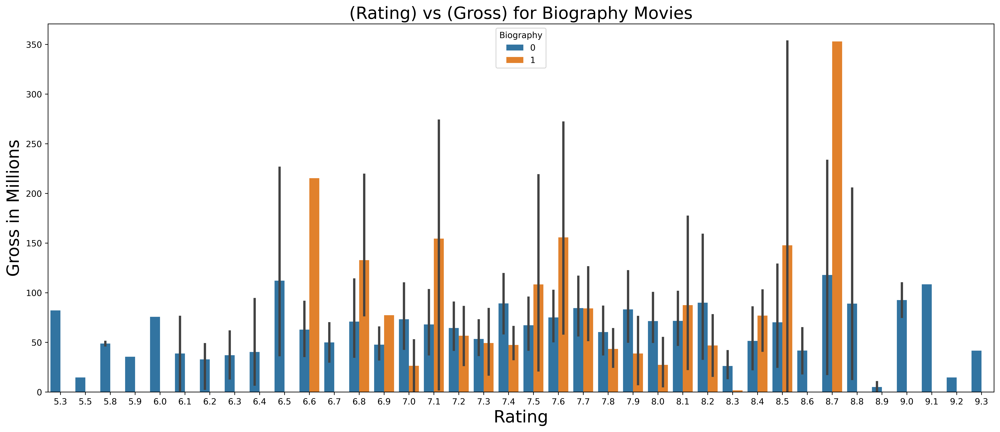

In [108]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='Biography')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for Biography Movies',fontsize=20);

In [109]:
df[(df['Biography']==1)&(df['Rating']==8.7)]

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
1,Goodfellas,1990,145,"Biography, Crime, Drama",8.7,382167,353.01,0,0,1,1,0,0,0,0,0,1,0


---

# 11.RATINGS & GROSS IN MILLIONS FOR WAR MOVIES

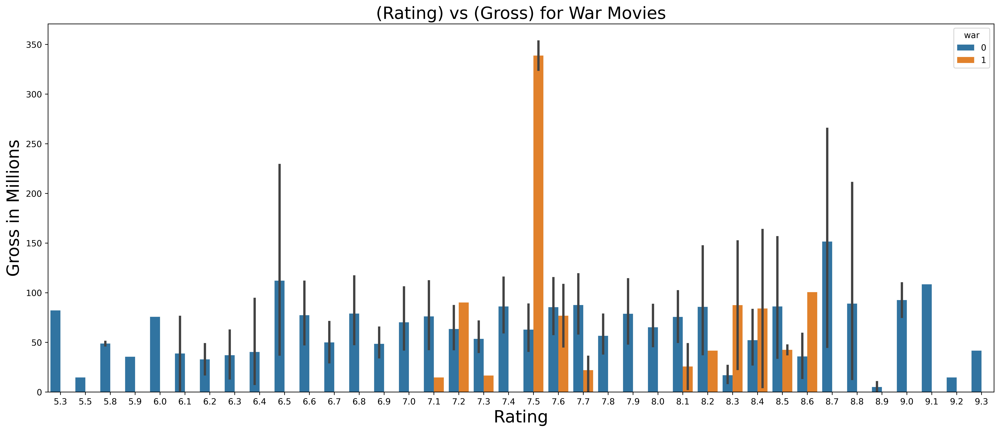

In [110]:
plt.figure(figsize=(20,8),dpi=600)
sns.barplot(data=df,x='Rating',y='Gross in Millions',hue='war')
plt.xlabel('Rating',fontsize=20)
plt.ylabel('Gross in Millions',fontsize=20)
plt.title('(Rating) vs (Gross) for War Movies',fontsize=20);

In [111]:
df[(df['war']==1)&(df['Rating']==7.5)]
# This is not only a war genre but by visualizing and analysing we got to know that it is also a drama genre.

,Title,Year of Release,Duration in min,Genre,Rating,Votes in Views,Gross in Millions,Action,Horror,Drama,Crime,Comedy,Thriller,Sci-Fi,Mystery,Adventure,Biography,war
186,Fahrenheit 9/11,2004,122,"Documentary, Drama, War",7.5,547316,324.59,0,0,1,0,0,0,0,0,0,0,1
371,The Wind that Shakes the Barley,2006,127,"Drama, War",7.5,382167,353.01,0,0,1,0,0,0,0,0,0,0,1


# Observation:

- This is not only a war genre but by visualizing and analysing we got to know that it is also a drama genre.

[plottinglinks](https://www.data-to-viz.com)

[np.largest](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.nlargest.html)

**`1. Adventure = 82.81M
2. Action = 75.15M
3. Drama = 74.34M
4. Crime = 69.80M
5. Comedy = 68.86M
6. Thriller = 60.95M
7. Mystery = 63.45M
8. Horror = 39.78M`**